![JohnSnowLabs](https://nlp.johnsnowlabs.com/assets/images/logo.png)

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JohnSnowLabs/visual-nlp-workshop/blob/master/jupyter/deid-and-obfuscation/DeIdentification.ipynb)

In [ ]:
license = ""
secret = ""
aws_access_key = ""
aws_secret_key = ""

version = secret.split("-")[0]
spark_ocr_jar_path = "../../../target/scala-2.12"

In [2]:
from sparkocr import start
import os
import sys

if license:
    os.environ['JSL_OCR_LICENSE'] = license
    os.environ['SPARK_NLP_LICENSE'] = license

if aws_access_key:
    os.environ['AWS_ACCESS_KEY'] = aws_access_key
    os.environ['AWS_SECRET_ACCESS_KEY'] = aws_secret_key

nlp_secret = ""

spark = start(jar_path=spark_ocr_jar_path, nlp_internal=True,
              nlp_secret=nlp_secret)

spark

Spark version: 3.5.0
Spark NLP version: 6.1.1
Spark NLP for Healthcare version: 6.1.0
Spark OCR version: 6.1.0



In [3]:
def write_pdf_to_disk(df, SAVE_OUTPUT_PDF):
  """
  df -> Result Dataframe from deid task.
  SAVE_OUTPUT_PDF -> Path to save output pdf.
  """

  import os

  os.makedirs(SAVE_OUTPUT_PDF, exist_ok=True)

  for row in df.select("path", "pdf").toLocalIterator():
    filename = row.asDict()["path"]
    basename = os.path.basename(filename).replace(".pdf", "")

    result_name = basename + "_result.pdf"

    savename = os.path.join(SAVE_OUTPUT_PDF, result_name)
    print(f"Saving File -> {savename}")

    pdfFile = open(savename, "wb")
    pdfFile.write(row.asDict()["pdf"])
    pdfFile.close()

In [4]:
# 📦 Spark OCR Imports
from sparkocr.transformers import *
from sparkocr.enums import *
from sparkocr.utils import *

# ⚡ Spark NLP Core
from sparknlp.base import *
from sparknlp.annotator import *
from sparknlp.pretrained import PretrainedPipeline

# 🔗 Spark ML
from pyspark.ml import Pipeline, PipelineModel
import pyspark.sql.functions as F

# 🧩 Spark NLP for Healthcare (JSL)
import sparknlp_jsl
from sparknlp_jsl.annotator import *

from IPython.display import display, Markdown

## 📄 PDF De-identification: Multi-Model Context Pipeline

This pretrained pipeline provides an **end-to-end solution**:

- **Input**: PDF `BinaryFile`  
- **Output**: PDF `BinaryFile`  

🔗 [pdf_deid_multi_model_context_pipeline](https://nlp.johnsnowlabs.com/2025/05/09/pdf_deid_multi_model_context_pipeline.html)

This pipeline is designed to **redact Protected Health Information (PHI)** entities from PDF documents using a **multi-model, context-aware approach**.  

### ✨ Entities Redacted
- 🏥 **HOSPITAL**  
- 👤 **NAME**  
- 🧑‍⚕️ **PATIENT**  
- 🆔 **ID**  
- 📑 **MEDICALRECORD**  
- 🔢 **IDNUM**  
- 🌍 **COUNTRY**  
- 📍 **LOCATION**  
- 🏠 **STREET**  
- 🗺️ **STATE**  
- 📨 **ZIP**  
- 📞 **CONTACT / PHONE**  
- 📅 **DATE**  

In [5]:
# Download Pretrained Pipeline
deid_pipeline = PretrainedPipeline("pdf_deid_multi_model_context_pipeline", "en", "clinical/ocr")

pdf_deid_multi_model_context_pipeline download started this may take some time.
Approx size to download 4.4 GB
[OK!]


## PDF Inference with Spark

Here we are going to:

1. **Read PDF input** using Spark.  
2. **Convert it to Binary** format.  
3. **Call the pretrained pipeline** with the `transform()` call.  
4. **Use the `display_pdf` utility** to view the output PDF.
5. **Use the write_pdf_to_disk function** to save the results.


    Image #0:
    Origin: file:/content/source_pdfs/Easy/PDF_Deid_Deidentification_0.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


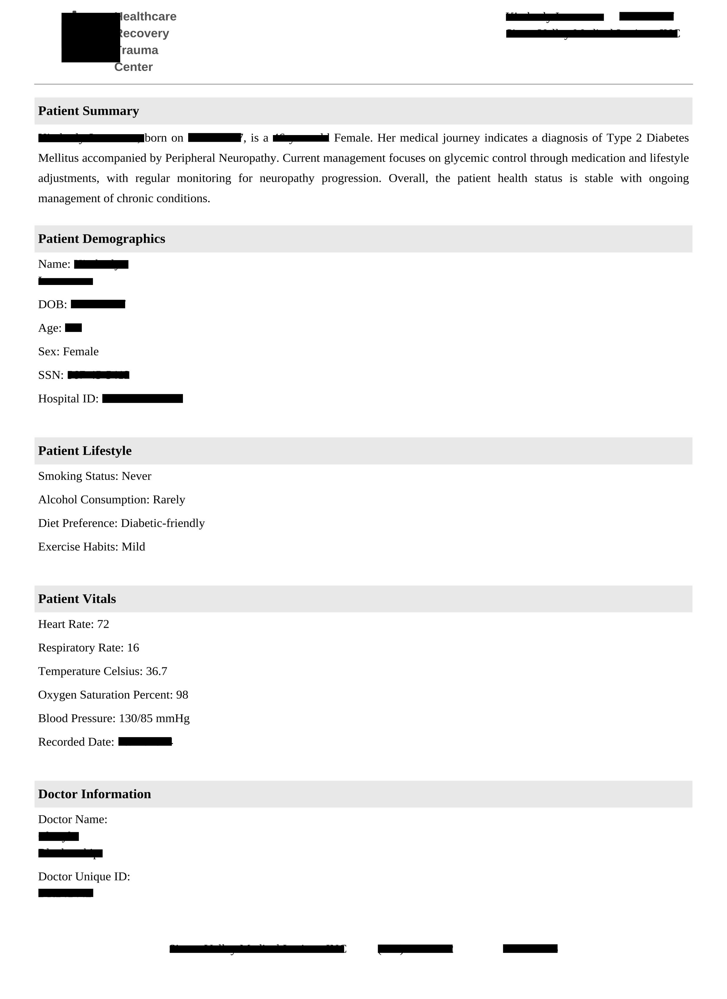


    Image #1:
    Origin: file:/content/source_pdfs/Easy/PDF_Deid_Deidentification_0.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


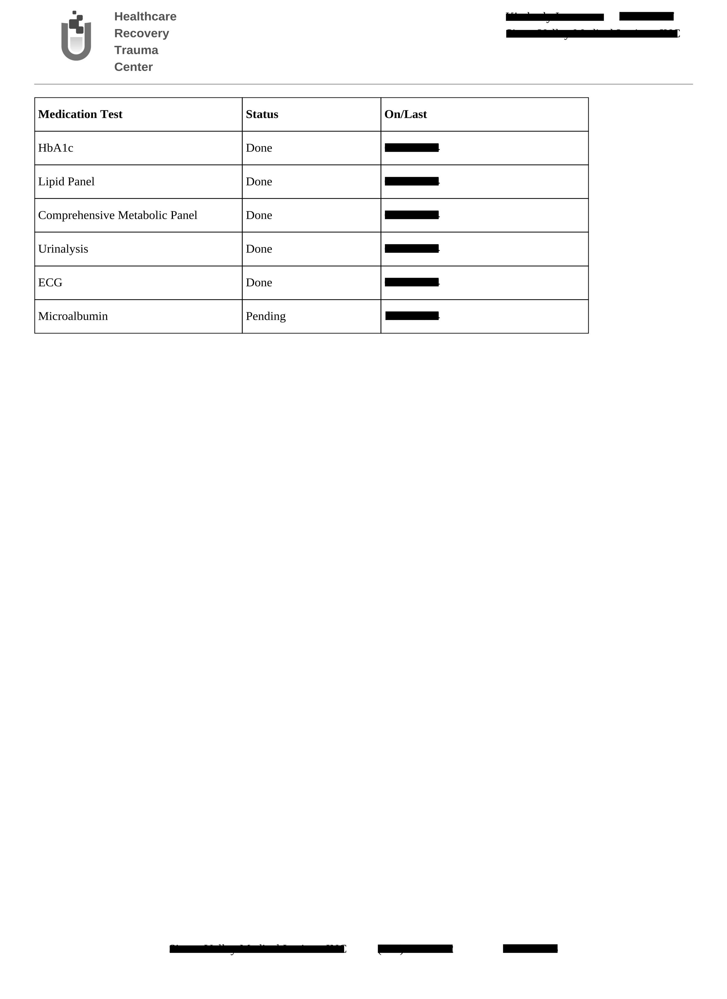


    Image #2:
    Origin: file:/content/source_pdfs/Easy/PDF_Deid_Deidentification_0.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


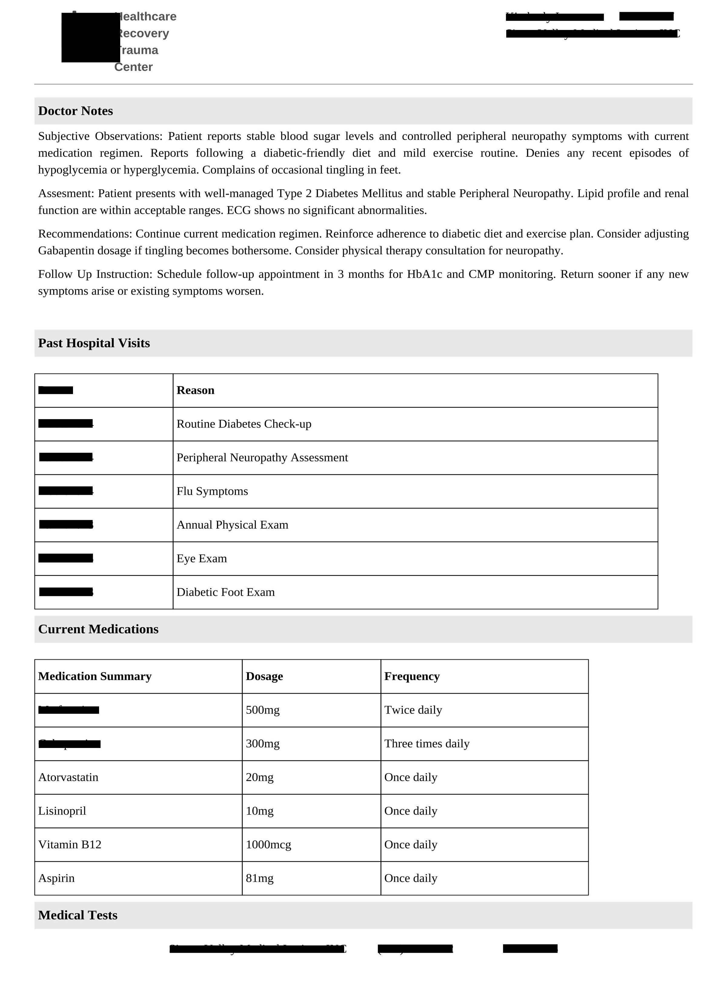

In [6]:
input_df = spark.read.format("binaryFile").load("./source_pdfs/Easy/PDF_Deid_Deidentification_0.pdf")

result = deid_pipeline.transform(input_df).cache()

display_pdf(result, "pdf")

#write_pdf_to_disk(result, "/content/result")

In [7]:
deid_pipeline.model.stages

[PdfToImage_3039dbc55d70,
 ImageToText_e47a60ca0cbf,
 DocumentAssembler_47aaa7f19fed,
 SentenceDetectorDLModel_6bafc4746ea5,
 REGEX_TOKENIZER_e1689c9bc262,
 WORD_EMBEDDINGS_MODEL_9004b1d00302,
 MedicalNerModel_9d4a08b1c03d,
 NerConverter_f230dec390db,
 CONTEXTUAL-PARSER_c654a34a3fa4,
 CONTEXTUAL-PARSER_33af26b2fdc0,
 CONTEXTUAL-PARSER_1b2769552347,
 CONTEXTUAL-PARSER_07bff3c2b284,
 CONTEXTUAL-PARSER_96b9d29769eb,
 CONTEXTUAL-PARSER_7aefd98e984c,
 ENTITY_EXTRACTOR_2ddfc4744b44,
 CONTEXTUAL-PARSER_99792b93398d,
 REGEX_MATCHER_2b137485db5e,
 CONTEXTUAL-PARSER_30dc43a095c1,
 CONTEXTUAL-PARSER_f64d354f0266,
 CONTEXTUAL-PARSER_72e20622d44a,
 CONTEXTUAL-PARSER_563cfd5f905d,
 REGEX_MATCHER_52d38a3643c9,
 MERGE_b0a322ec2787,
 MERGE_97a646c7a333,
 XLM_ROBERTA_EMBEDDINGS_b8a75c006754,
 MedicalNerModel_59183c57aedb,
 NER_CONVERTER_a3d70cd61248,
 PretrainedZeroShotNER_ca8c4dfe310f,
 NER_CONVERTER_86c4cbb15961,
 PretrainedZeroShotNER_5f30ab9002f1,
 NER_CONVERTER_b537928b54d8,
 MERGE_1b7360979a74,
 P

# 🔄 De-identification Pipeline Overview  

## 1. **PdfToImage** → *(First stage)*  
- Converts PDF pages into images.  
- **Default in pretrained pipeline:** grayscale.  
- **Customization:** overwritten to generate **colored images** instead.  

---

## 2. **Intermediate Visual Stages**  
- All **visual processing** runs directly on the images generated from PDFs.  

---

## 3. **DocumentAssembler** → *(Third stage)*  
- Serves as the entry point for **Healthcare NLP operations**.  

---

## 4. **Healthcare NLP Stages**  
- Perform **entity recognition** and **PHI detection**.  
- Results are consolidated in the **MERGE stage** *(fourth from bottom)*.  

---

## 5. **Visual Stages (Post-NLP)**  

### 🔹 PositionFinder  
- **Input:** `CHUNK`  
- **Output:** Coordinates (regions containing PHI).  
- **Params:**  
  - `smoothCoordinates`: Improves boundary alignment and avoids clipping nearby non-PHI text.  

### 🔹 ImageDrawRegions (Deidentification)  
- **Input:** `Image + Coordinates`  
- **Output:** De-identified image  
- **Params:**  
  - `patchImage = False` → performs **deidentification** (not patching).  
  - `filledRect` → whether PHI regions should be filled.  
  - `RectColor` → color of the fill/box drawn over PHI regions.  

---

## 6. **ImageToPDF** → *(Final stage)*  
- Converts processed images back into a PDF.  
- **Note:** This is an **aggregation stage**, which discards intermediate results.  
- **Customization:** remove this stage to inspect intermediate outputs.  

---

# ⚙️ Customization Notes  
- `deid_pipeline.model.stages[:-3]`  
  - Keeps all stages except the **last three**.  

- `stages[0] = pdf_to_image`  
  - Replaces the original **PdfToImage** with a new one (e.g., for colored image extraction).  

---

In [8]:
stages = deid_pipeline.model.stages[:-3].copy()

pdf_to_image = PdfToImage() \
  .setInputCol("content") \
  .setSplitNumBatch(10) \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR) \
  .setSplittingStategy(SplittingStrategy.FIXED_NUMBER_OF_PARTITIONS)

position_finder = PositionFinder() \
  .setInputCols("merged_ner_chunk") \
  .setOutputCol("coordinates") \
  .setPageMatrixCol("positions") \
  .setSmoothCoordinates(True)

draw_regions = ImageDrawRegions() \
  .setInputCol("image_raw") \
  .setInputRegionsCol("coordinates") \
  .setRectColor(Color.red) \
  .setFilledRect(True) \
  .setOutputCol("image_deid")

stages[0] = pdf_to_image
stages.append(position_finder)
stages.append(draw_regions)

deidentification_pipe = PipelineModel(stages=stages)

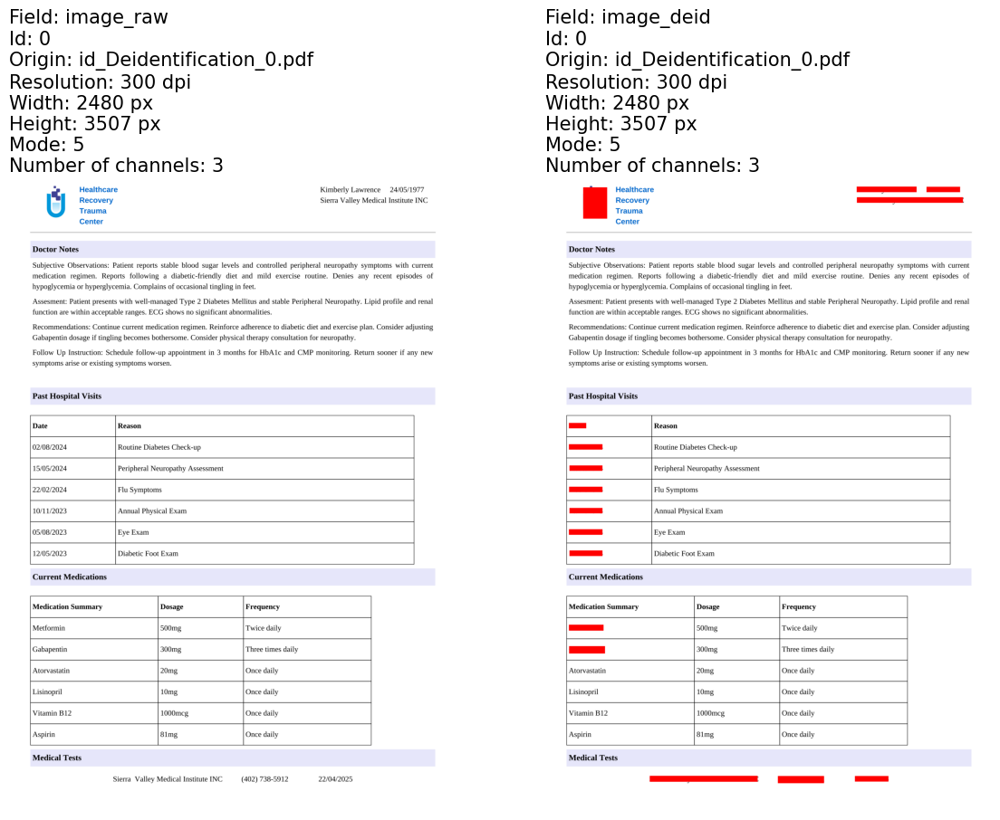

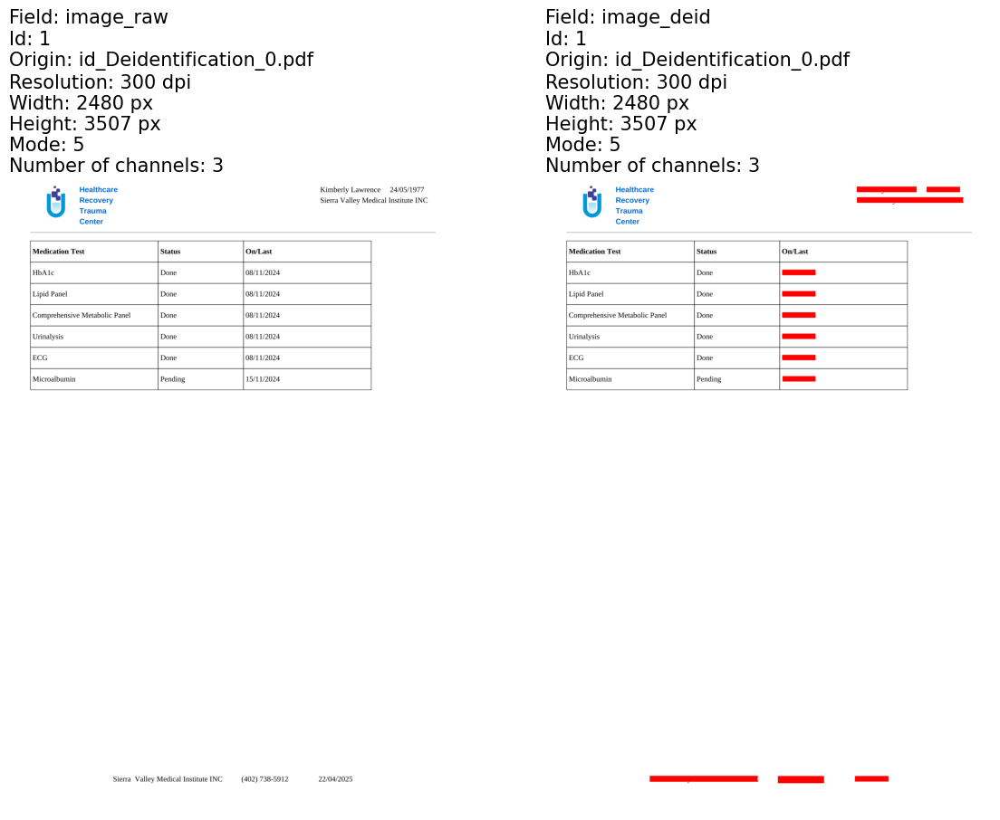

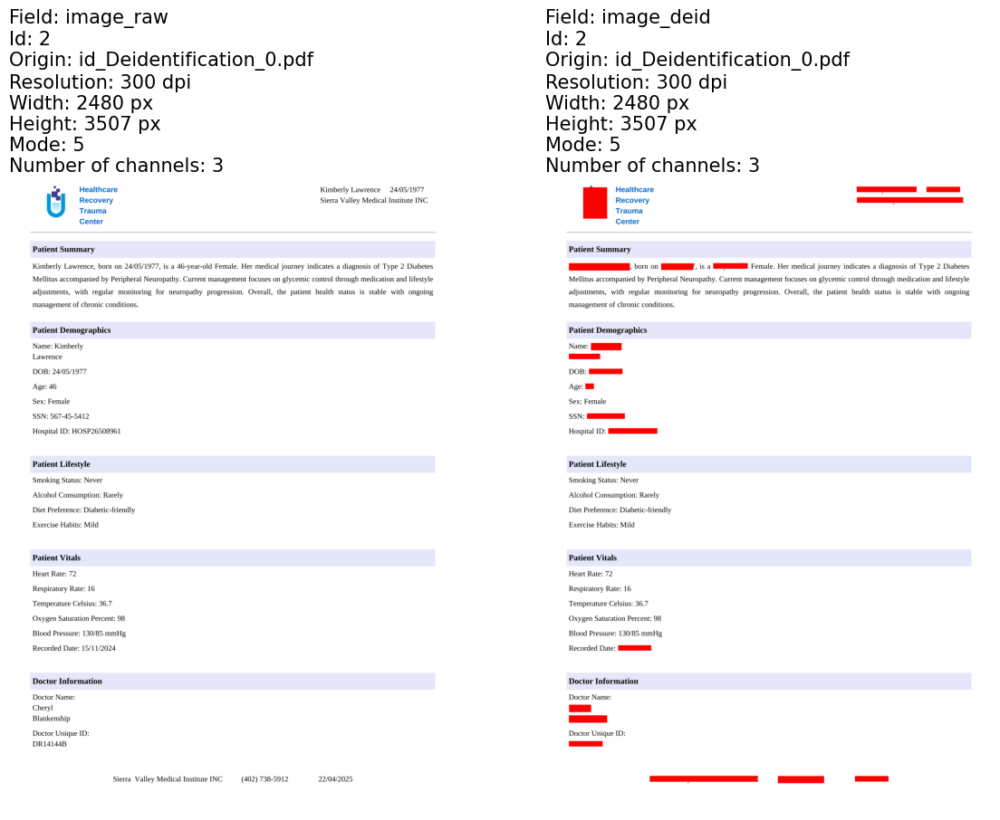

In [9]:
result = deidentification_pipe.transform(input_df).cache()

display_images_horizontal(result, "image_raw,image_deid")

In [10]:
result.withColumn("res", F.explode(F.col("merged_ner_chunk"))) \
    .select("res.result", "res.metadata.entity", "pagenum") \
    .orderBy("pagenum").show(100, False)

+-----------------------------------+--------+-------+
|result                             |entity  |pagenum|
+-----------------------------------+--------+-------+
|24/05/1977                         |DATE    |0      |
|Kimberly Lawrence                  |PATIENT |0      |
|Sierra Valley Medical Institute INC|HOSPITAL|0      |
|0                                  |IDNUM   |0      |
|Kimberly Lawrence                  |PATIENT |0      |
|24/05/1977                         |DATE    |0      |
|46-year-old                        |AGE     |0      |
|Kimberly                           |PATIENT |0      |
|Lawrence                           |PATIENT |0      |
|24/05/1977                         |DATE    |0      |
|46                                 |AGE     |0      |
|567-45-5412                        |SSN     |0      |
|HOSP26508961                       |IDNUM   |0      |
|15/11/2024                         |DATE    |0      |
|Cheryl                             |PATIENT |0      |
|Blankensh

# 🔎 OCR & NER Observations  

- The **OCR stage** is mistakenly detecting the **logo** as the character **"0"**.  
- The **NER stages** are classifying this as an **IDNUM**.  

- **Medications** like **Metformin** and **Gabapentin** are being classified as **NAMES**.  
  - While this is technically not incorrect, these entities should not be kept in the final output.  

- **Date** is being classified as **DATE**.  
  - This is also correct, but we will filter them out for our use case.  

---

# ⚙️ Solution  

We can use the **[`ChunkFilterer`](https://www.johnsnowlabs.com/refining-entity-detection-in-healthcare-nlp-precision-through-entity-filtering/)** stage to **remove these entities**:  

This ensures that only relevant PHI entities are passed forward in the pipeline.  

---

# 📚 References  

- Blog: [Refining Entity Detection in Healthcare NLP – Precision through Entity Filtering](https://www.johnsnowlabs.com/refining-entity-detection-in-healthcare-nlp-precision-through-entity-filtering/)  
- Notebook: [ChunkFilterer Example (Spark NLP Workshop)](https://github.com/JohnSnowLabs/spark-nlp-workshop/blob/master/Spark_NLP_Udemy_MOOC/Healthcare_NLP/ChunkFilterer.ipynb)  

In [11]:
stages = deid_pipeline.model.stages[:-3].copy()

pdf_to_image = PdfToImage() \
  .setInputCol("content") \
  .setSplitNumBatch(10) \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR) \
  .setSplittingStategy(SplittingStrategy.FIXED_NUMBER_OF_PARTITIONS)

chunkerFilter = ChunkFilterer() \
  .setInputCols(["sentence", "merged_ner_chunk"]) \
  .setOutputCol("filtered_chunks") \
  .setCriteria("isin") \
  .setBlackList(["Date", "Gabapentin", "Metformin", "0"])

position_finder = PositionFinder() \
  .setInputCols("filtered_chunks") \
  .setOutputCol("coordinates") \
  .setPageMatrixCol("positions") \
  .setSmoothCoordinates(True)

draw_regions = ImageDrawRegions() \
  .setInputCol("image_raw") \
  .setInputRegionsCol("coordinates") \
  .setPatchImages(False) \
  .setFilledRect(True) \
  .setRectColor(Color.green) \
  .setOutputCol("image_deid")

stages[0] = pdf_to_image
stages.append(chunkerFilter)
stages.append(position_finder)
stages.append(draw_regions)

deidentification_pipe = PipelineModel(stages=stages)

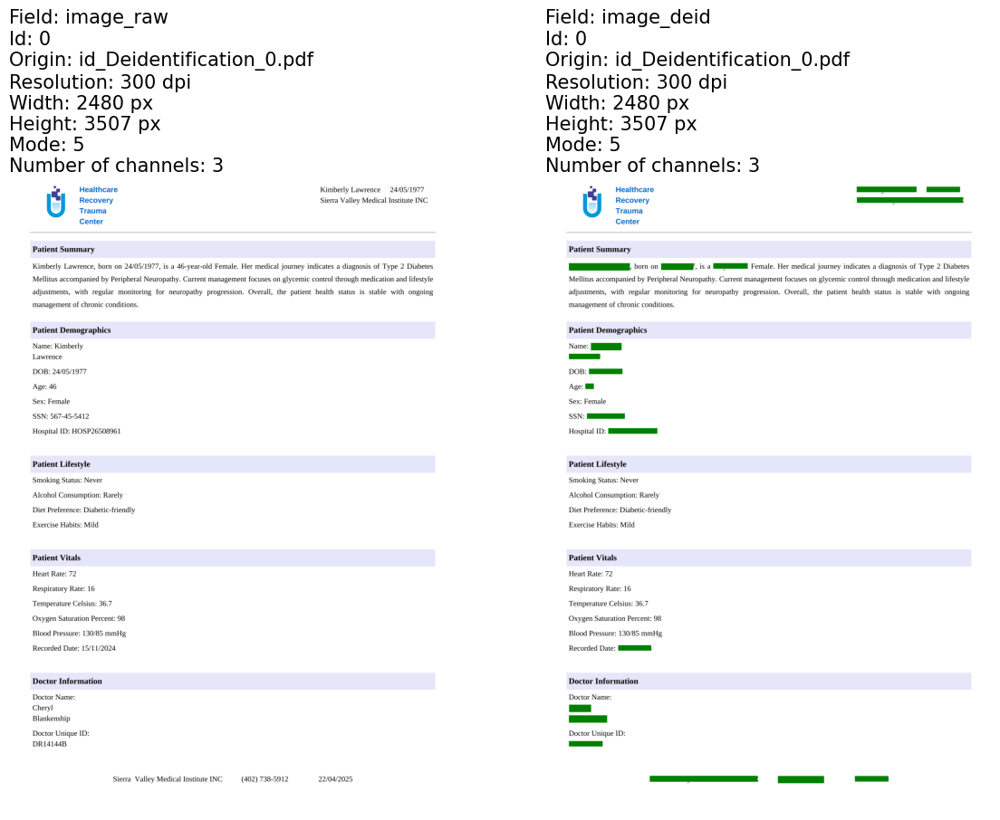

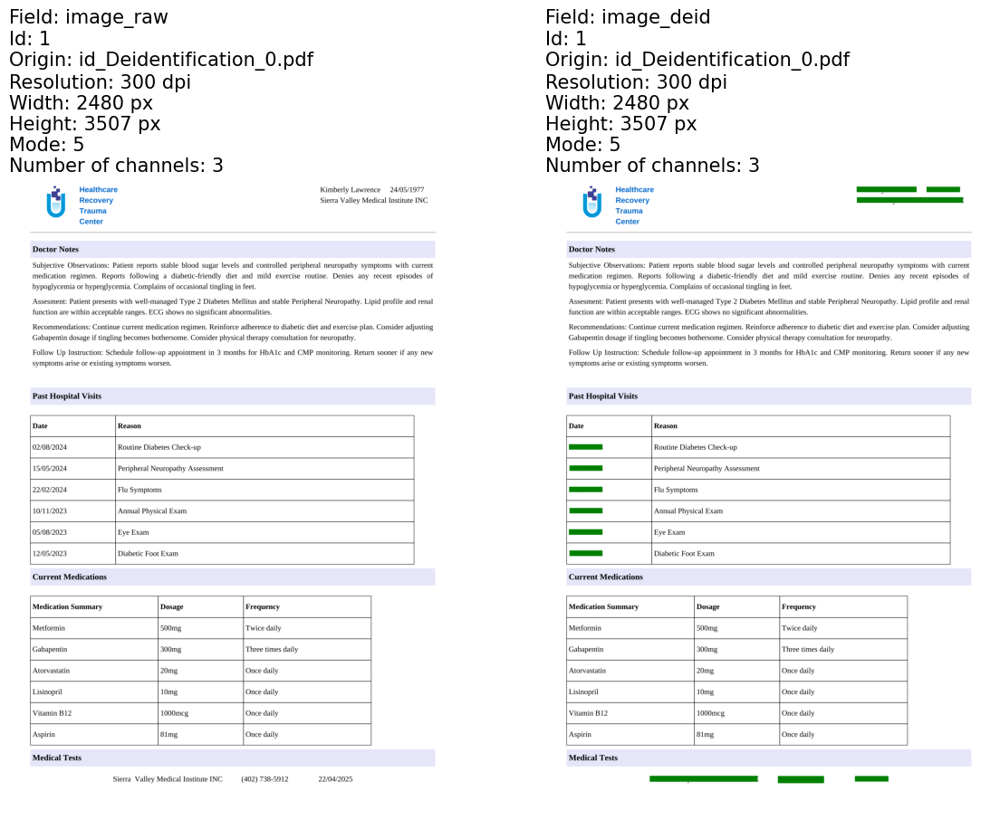

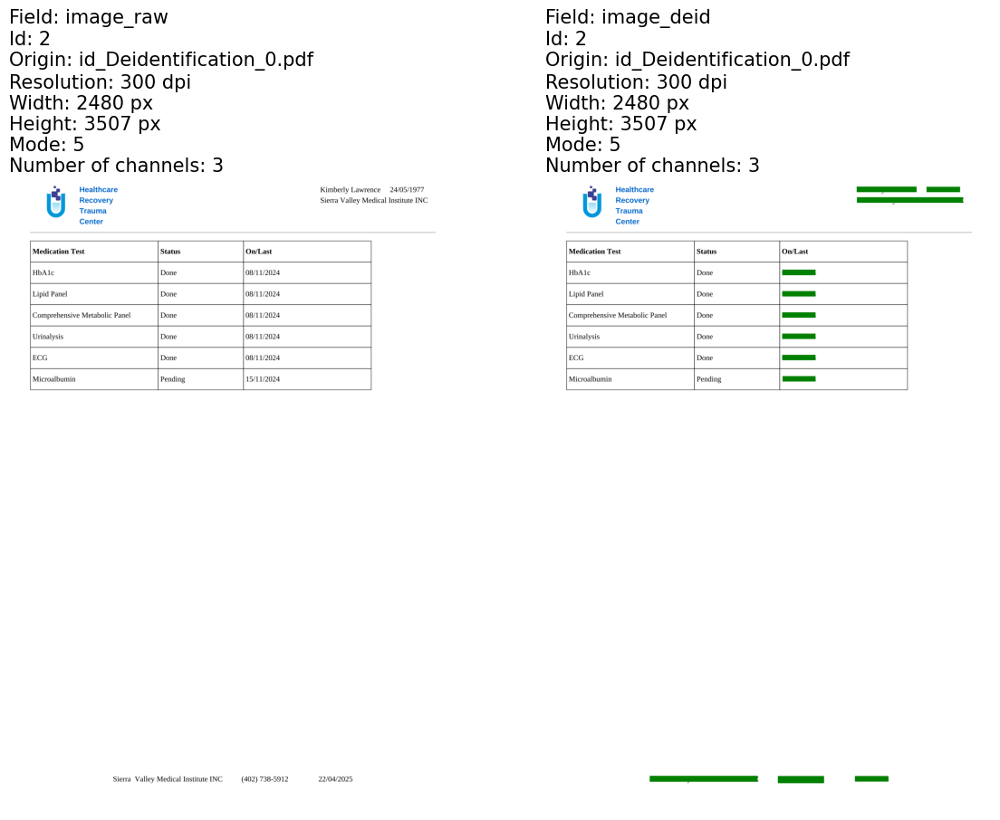

In [12]:
result = deidentification_pipe.transform(input_df).cache()

display_images_horizontal(result.orderBy(F.col("pagenum")), "image_raw,image_deid")

In [13]:
result.withColumn("res", F.explode(F.col("filtered_chunks"))) \
    .select("res.result", "res.metadata.entity", "pagenum") \
    .orderBy("pagenum").show(100, False)

+-----------------------------------+--------+-------+
|result                             |entity  |pagenum|
+-----------------------------------+--------+-------+
|24/05/1977                         |DATE    |0      |
|Kimberly Lawrence                  |PATIENT |0      |
|Sierra Valley Medical Institute INC|HOSPITAL|0      |
|Kimberly Lawrence                  |PATIENT |0      |
|24/05/1977                         |DATE    |0      |
|46-year-old                        |AGE     |0      |
|Kimberly                           |PATIENT |0      |
|Lawrence                           |PATIENT |0      |
|24/05/1977                         |DATE    |0      |
|46                                 |AGE     |0      |
|567-45-5412                        |SSN     |0      |
|HOSP26508961                       |IDNUM   |0      |
|15/11/2024                         |DATE    |0      |
|Cheryl                             |PATIENT |0      |
|Blankenship                        |STREET  |0      |
|DR14144B 

# 📄 Handling Medium-Complexity PDF Files  

When moving to **denser documents**, the challenges increase due to layout variety and added noise.  

---

## 🔹 Characteristics of Medium PDF Files  
- **Different Layouts**  
  - Multi-column sections  
  - Tables with merged cells  
  - Headers & footers with overlapping elements  

- **Added Noise**  
  - Ink bleed through pages  
  - Dirty screen effects  
  - Subtle background textures (e.g., scanned reports, faint grids, hospital letterheads)  

---

In [14]:
input_df = spark.read.format("binaryFile").load("./source_pdfs/Medium/PDF_Deid_Deidentification_Medium_0.pdf")

In [15]:
stages = deid_pipeline.model.stages[:-3].copy()

pdf_to_image = PdfToImage() \
  .setInputCol("content") \
  .setSplitNumBatch(10) \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR) \
  .setSplittingStategy(SplittingStrategy.FIXED_NUMBER_OF_PARTITIONS)

position_finder = PositionFinder() \
  .setInputCols("merged_ner_chunk") \
  .setOutputCol("coordinates") \
  .setPageMatrixCol("positions") \
  .setSmoothCoordinates(True)

draw_regions = ImageDrawRegions() \
  .setInputCol("image_raw") \
  .setInputRegionsCol("coordinates") \
  .setRectColor(Color.ghostwhite) \
  .setFilledRect(True) \
  .setOutputCol("image_deid")

stages[0] = pdf_to_image
stages.append(position_finder)
stages.append(draw_regions)

deidentification_pipe = PipelineModel(stages=stages)

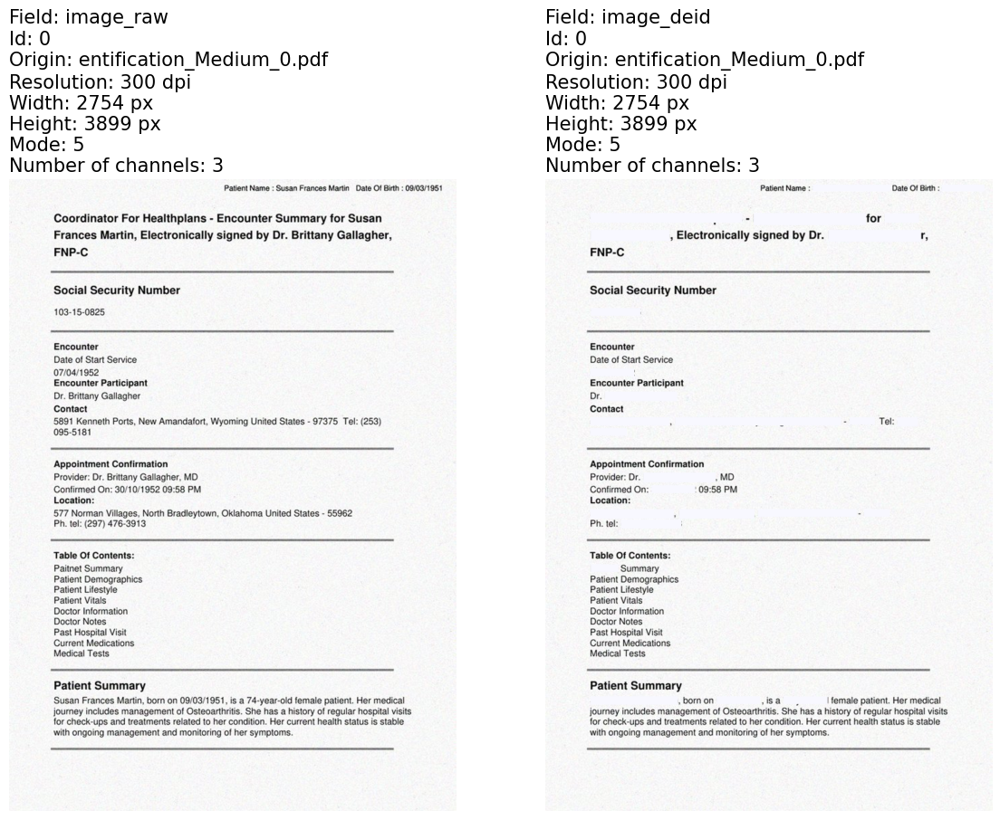

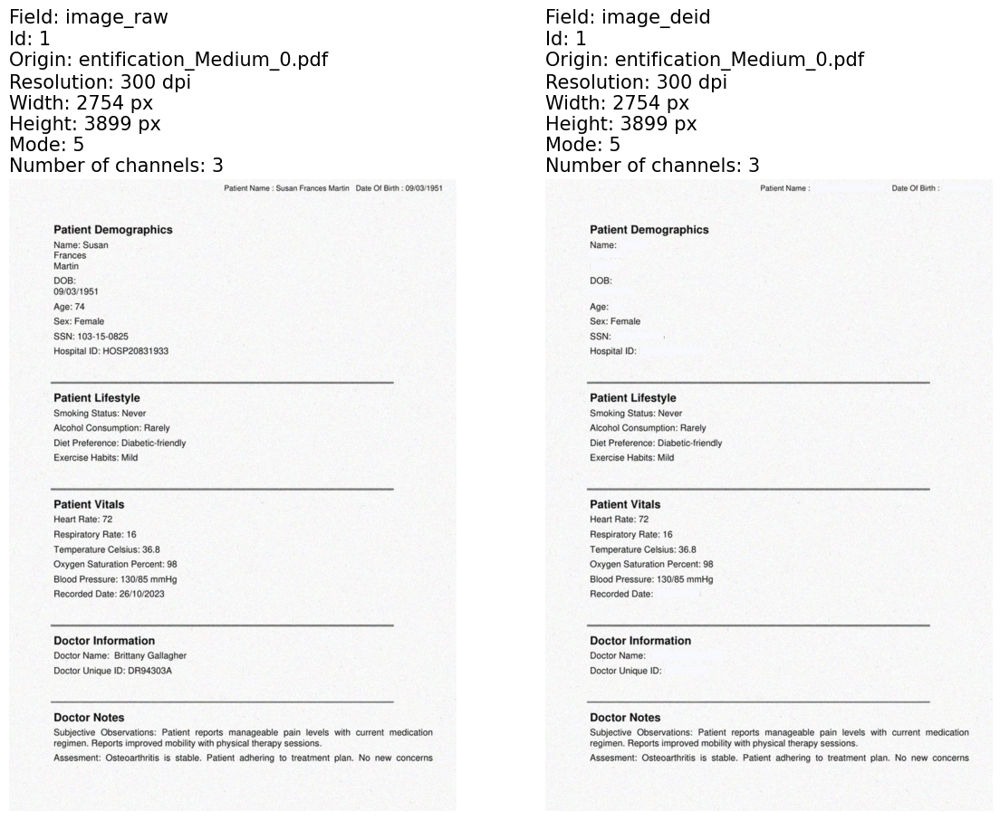

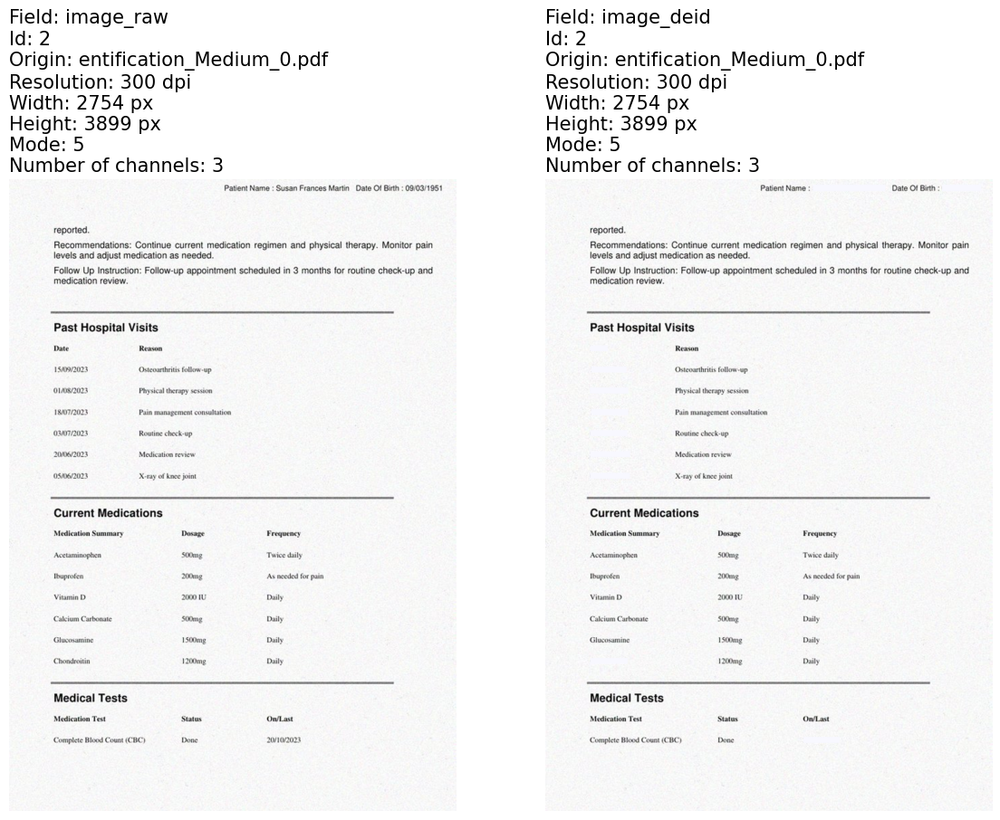

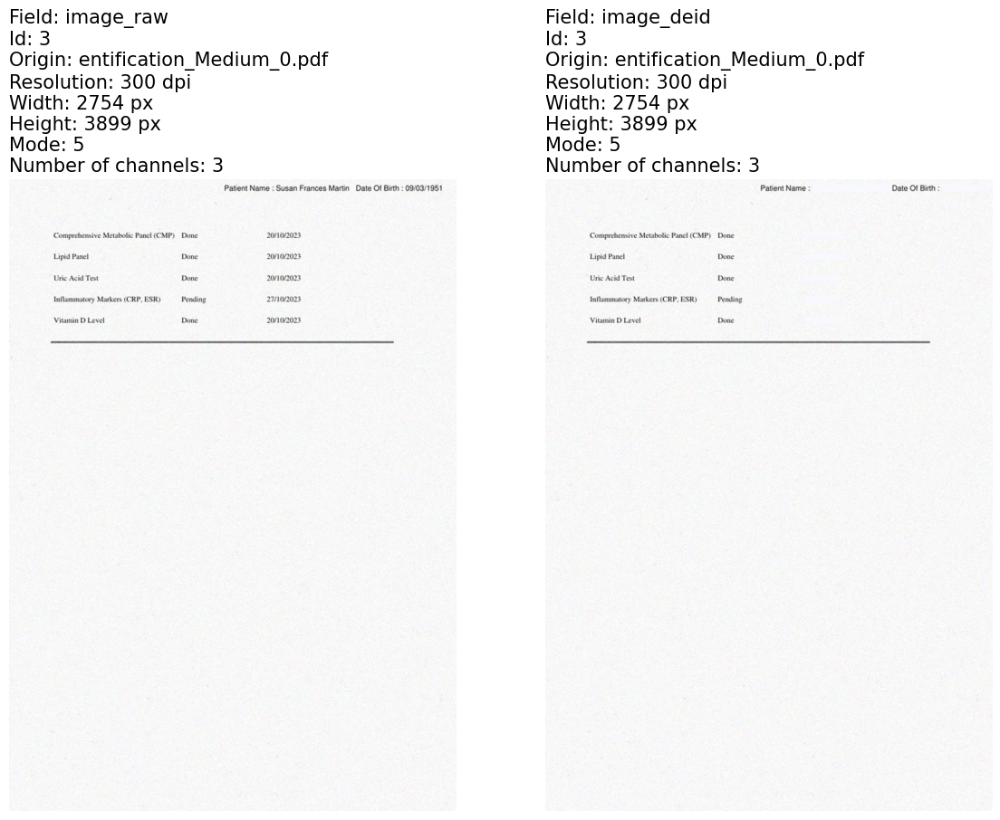

In [16]:
result = deidentification_pipe.transform(input_df).cache()

display_images_horizontal(result.orderBy(F.col("pagenum")), "image_raw,image_deid")

In [17]:
result.withColumn("res", F.explode(F.col("merged_ner_chunk"))) \
    .select("res.result", "res.metadata.entity", "pagenum") \
    .orderBy("pagenum").show(100, False)

+-------------------------------------+------------+-------+
|result                               |entity      |pagenum|
+-------------------------------------+------------+-------+
|Susan Frances Martin                 |PATIENT     |0      |
|09/03/1951                           |DATE        |0      |
|Coordinator For Healthplans          |PROFESSION  |0      |
|Encounter Summary                    |PROFESSION  |0      |
|Susan                                |PATIENT     |0      |
|Frances Martin                       |DOCTOR      |0      |
|Brittany Gallagher                   |DOCTOR      |0      |
|103-15-0825                          |IDNUM       |0      |
|07/04/1952                           |DATE        |0      |
|Brittany Gallagher                   |DOCTOR      |0      |
|5891 Kenneth Ports                   |STREET      |0      |
|New Amandafort, Wyoming United States|PATIENT     |0      |
|97375                                |ZIP         |0      |
|(253)\n095-5181        

# 📄 Handling Hard-Complexity PDF Files  

Hard PDF files represent the **most challenging scenarios** due to their layout density and physical noise artifacts.  

---

## 🔹 Characteristics of Hard PDF Files  
- **Dense Layouts**  
  - Extremely **compact text on single lines** (minimal spacing).  
  - Multi-section pages with overlapping content.  
  - High word density leading to OCR segmentation errors.  

- **Severe Noise Factors**  
  - **Punch holes (left margin)** interfering with line detection.  
  - **Binder clips (right margin)** creating false dark regions.  
  - **Noise texturisation** across the page.  
  - **Moire patterns** (scanner/photocopy artifacts) distorting readability.  

---

In [18]:
input_df = spark.read.format("binaryFile").load("./source_pdfs/Hard/PDF_Deid_Deidentification_Hard_0.pdf")

In [19]:
stages = deid_pipeline.model.stages[:-3].copy()

pdf_to_image = PdfToImage() \
  .setInputCol("content") \
  .setSplitNumBatch(10) \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR) \
  .setSplittingStategy(SplittingStrategy.FIXED_NUMBER_OF_PARTITIONS)

position_finder = PositionFinder() \
  .setInputCols("merged_ner_chunk") \
  .setOutputCol("coordinates") \
  .setPageMatrixCol("positions") \
  .setSmoothCoordinates(True)

draw_regions = ImageDrawRegions() \
  .setInputCol("image_raw") \
  .setInputRegionsCol("coordinates") \
  .setRectColor(Color.gray) \
  .setFilledRect(True) \
  .setOutputCol("image_deid")

stages[0] = pdf_to_image
stages.append(position_finder)
stages.append(draw_regions)

deidentification_pipe = PipelineModel(stages=stages)

In [20]:
result = deidentification_pipe.transform(input_df).cache()

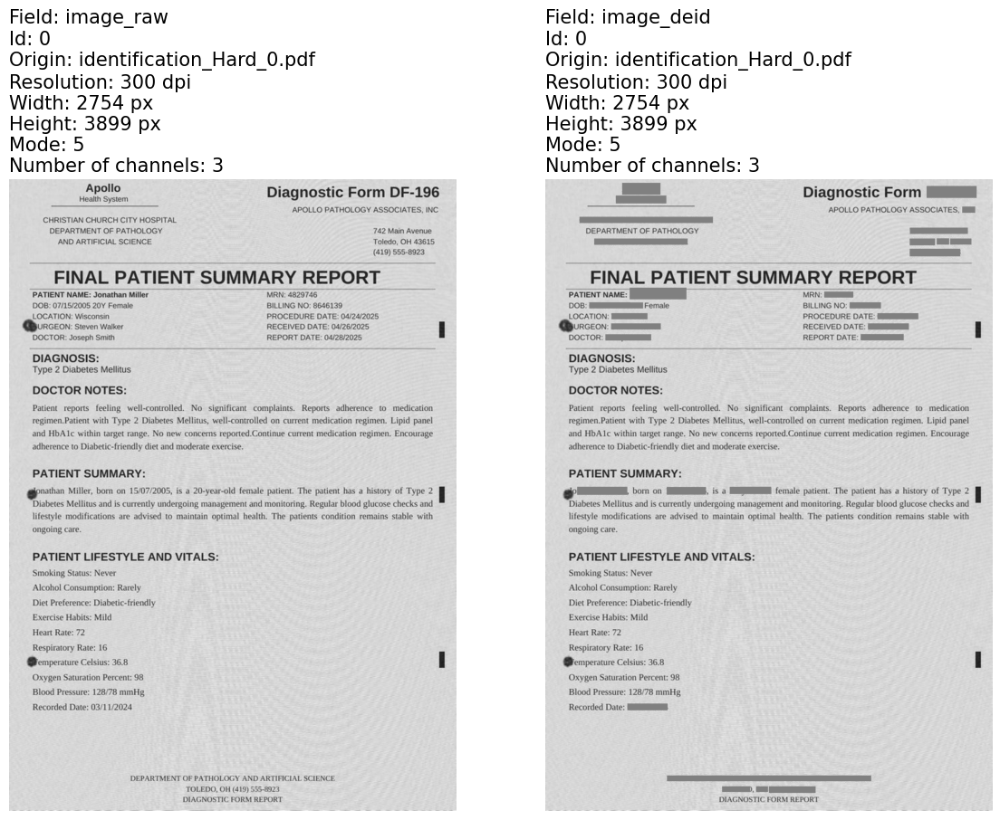

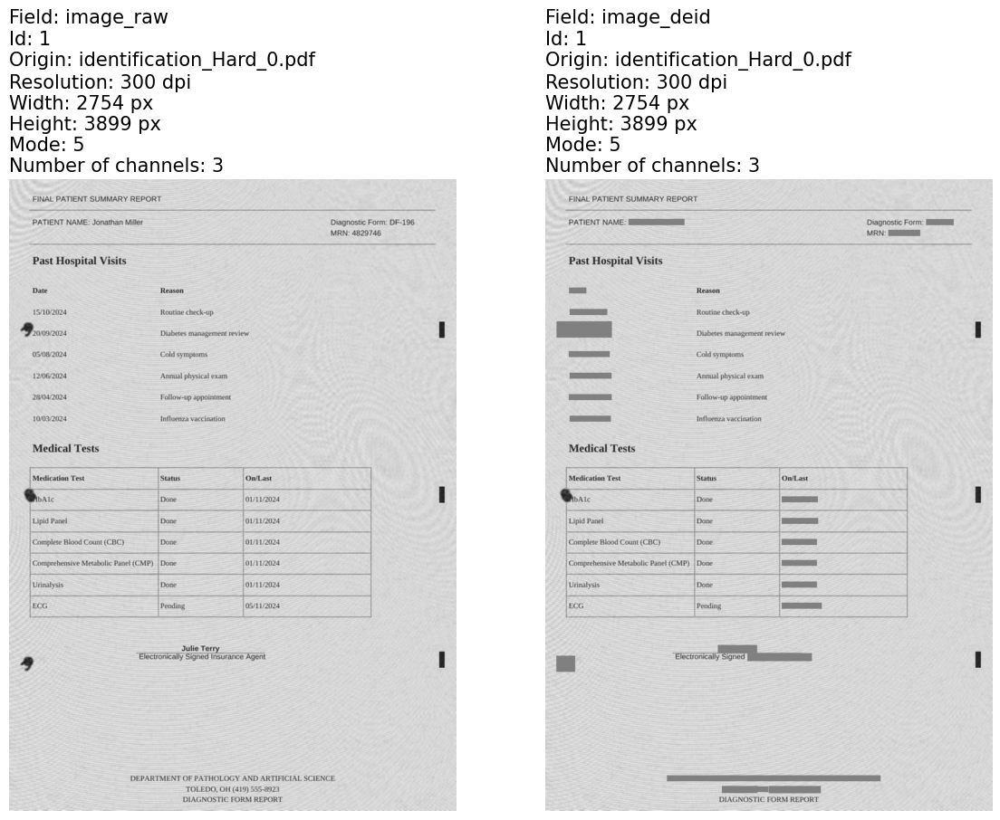

In [21]:
display_images_horizontal(result.orderBy(F.col("pagenum")), "image_raw,image_deid")

In [22]:
result.withColumn("res", F.explode(F.col("merged_ner_chunk"))) \
    .select("res.result", "res.metadata.entity", "pagenum") \
    .orderBy("pagenum").show(100, False)

+----------------------------------------------+-------------+-------+
|result                                        |entity       |pagenum|
+----------------------------------------------+-------------+-------+
|Apollo                                        |NAME         |0      |
|DF-196                                        |DATE         |0      |
|Health System                                 |ORGANIZATION |0      |
|INC\nCHRISTIAN CHURCH CITY HOSPITAL           |HOSPITAL     |0      |
|742 Main Avenue                               |STREET       |0      |
|AND ARTIFICIAL SCIENCE                        |PROFESSION   |0      |
|Toledo                                        |CITY         |0      |
|OH                                            |STATE        |0      |
|43615                                         |ZIP          |0      |
|(419) 555-8923                                |PHONE        |0      |
|Jonathan Miller                               |PATIENT      |0      |
|48297

# 🖼️ Image Deidentification with Pretrained Pipelines  

You can convert any of the **PDF Pretrained Pipelines** to work with **Images** instead of PDFs.  

---

## 🔹 How to Adapt the Pipeline  

1. **Replace**  
   - Swap out the **`PdfToImage`** stage with **`BinaryToImage`**.  

2. **Remove**  
   - Drop the last stage **`ImageToPDF`**, since we want to save the **images** rather than reconvert them back to PDF.  

3. **Output Column Consistency**  
   - Ensure the **`outputCol`** of `BinaryToImage` is the **same as in the original `PdfToImage` stage**.  
   - You can check the `outputCol` name in the `PdfToImage` stage and reuse it for `BinaryToImage`.  

---

In [23]:
deid_pipeline.model.stages

[PdfToImage_3039dbc55d70,
 ImageToText_e47a60ca0cbf,
 DocumentAssembler_47aaa7f19fed,
 SentenceDetectorDLModel_6bafc4746ea5,
 REGEX_TOKENIZER_e1689c9bc262,
 WORD_EMBEDDINGS_MODEL_9004b1d00302,
 MedicalNerModel_9d4a08b1c03d,
 NerConverter_f230dec390db,
 CONTEXTUAL-PARSER_c654a34a3fa4,
 CONTEXTUAL-PARSER_33af26b2fdc0,
 CONTEXTUAL-PARSER_1b2769552347,
 CONTEXTUAL-PARSER_07bff3c2b284,
 CONTEXTUAL-PARSER_96b9d29769eb,
 CONTEXTUAL-PARSER_7aefd98e984c,
 ENTITY_EXTRACTOR_2ddfc4744b44,
 CONTEXTUAL-PARSER_99792b93398d,
 REGEX_MATCHER_2b137485db5e,
 CONTEXTUAL-PARSER_30dc43a095c1,
 CONTEXTUAL-PARSER_f64d354f0266,
 CONTEXTUAL-PARSER_72e20622d44a,
 CONTEXTUAL-PARSER_563cfd5f905d,
 REGEX_MATCHER_52d38a3643c9,
 MERGE_b0a322ec2787,
 MERGE_97a646c7a333,
 XLM_ROBERTA_EMBEDDINGS_b8a75c006754,
 MedicalNerModel_59183c57aedb,
 NER_CONVERTER_a3d70cd61248,
 PretrainedZeroShotNER_ca8c4dfe310f,
 NER_CONVERTER_86c4cbb15961,
 PretrainedZeroShotNER_5f30ab9002f1,
 NER_CONVERTER_b537928b54d8,
 MERGE_1b7360979a74,
 P

In [24]:
pdf_to_image = deid_pipeline.model.stages[0]
pdf_to_image.getOrDefault(pdf_to_image.getParam("outputCol"))

'image_raw'

In [25]:
# Use PdfToImage to extract Images from PDF.
pdf_to_image = PdfToImage() \
  .setInputCol("content") \
  .setSplitNumBatch(10) \
  .setResolution(400) \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR) \
  .setSplittingStategy(SplittingStrategy.FIXED_NUMBER_OF_PARTITIONS)

# Call PDF To Image
images = pdf_to_image.transform(input_df)

# Extract the first page and convert to image, can be repurposed to save image to disk.
image_dict = images.filter(F.col("pagenum") == 0).select("image_raw").collect()[0].asDict()["image_raw"]
mode = image_dict["mode"]
image = to_pil_image(image_dict, mode)

# Save to Temporary Location
import tempfile

with tempfile.NamedTemporaryFile(delete=False, suffix=".png") as tmp_file:
    image.save(tmp_file.name, format="PNG")
    print(f"Image saved at: {tmp_file.name}")

Image saved at: /tmp/tmpwzspsyp7.png


In [26]:
stages = deid_pipeline.model.stages[:-3].copy()

binaryToImage = BinaryToImage() \
  .setInputCol("content") \
  .setOutputCol("image_raw") \
  .setImageType(ImageType.TYPE_3BYTE_BGR)

position_finder = PositionFinder() \
  .setInputCols("merged_ner_chunk") \
  .setOutputCol("coordinates") \
  .setPageMatrixCol("positions") \
  .setSmoothCoordinates(True)

draw_regions = ImageDrawRegions() \
  .setInputCol("image_raw") \
  .setInputRegionsCol("coordinates") \
  .setRectColor(Color.gray) \
  .setFilledRect(True) \
  .setOutputCol("image_deid")

stages[0] = binaryToImage
stages.append(position_finder)
stages.append(draw_regions)

deidentification_image_pipe = PipelineModel(stages=stages)

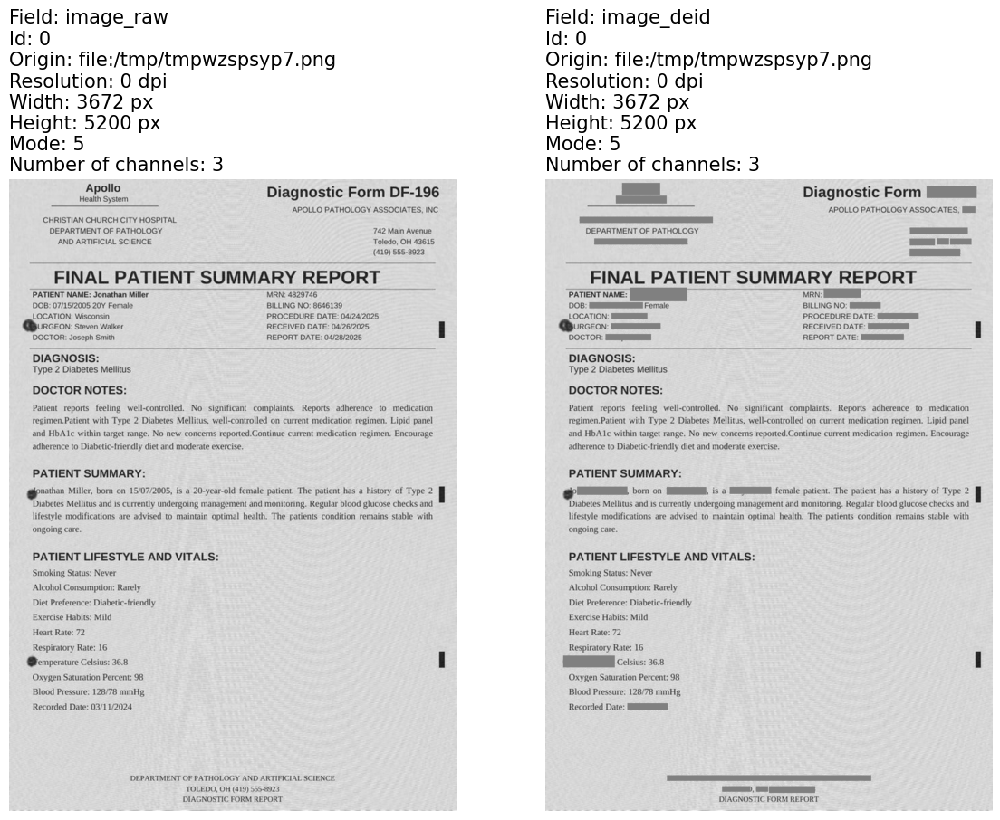

In [27]:
input_df = spark.read.format("binaryFile").load(tmp_file.name)
result = deidentification_image_pipe.transform(input_df).cache()

display_images_horizontal(result.orderBy(F.col("pagenum")), "image_raw,image_deid")

In [28]:
result.withColumn("res", F.explode(F.col("merged_ner_chunk"))) \
    .select("res.result", "res.metadata.entity", "pagenum") \
    .orderBy("pagenum").show(100, False)

+----------------------------------------------+-------------+-------+
|result                                        |entity       |pagenum|
+----------------------------------------------+-------------+-------+
|Apollo                                        |NAME         |0      |
|Health System                                 |ORGANIZATION |0      |
|DF-196                                        |DATE         |0      |
|INC\nCHRISTIAN CHURCH CITY HOSPITAL           |HOSPITAL     |0      |
|742 Main Avenue                               |STREET       |0      |
|AND ARTIFICIAL SCIENCE                        |PROFESSION   |0      |
|Toledo                                        |CITY         |0      |
|OH                                            |STATE        |0      |
|43615                                         |ZIP          |0      |
|(419) 555-8923                                |PHONE        |0      |
|Jonathan Miller                               |PATIENT      |0      |
|48297

In [29]:
tmp_file.close()

# ✍️ Deidentification with Signature-Aware Redaction  

This pretrained pipeline performs the full **deidentification workflow** we have seen so far, with an added capability:  

👉 **Signature Detection and Removal**

In [30]:
deid_pipeline = PretrainedPipeline("pdf_deid_multi_model_context_signature_aware_pipeline", "en", "clinical/ocr")

pdf_deid_multi_model_context_signature_aware_pipeline download started this may take some time.
Approx size to download 4.7 GB
[OK!]



    Image #0:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 400 dpi
    Width: 3307 px
    Height: 4677 px
    Mode: 5
    Number of channels: 3


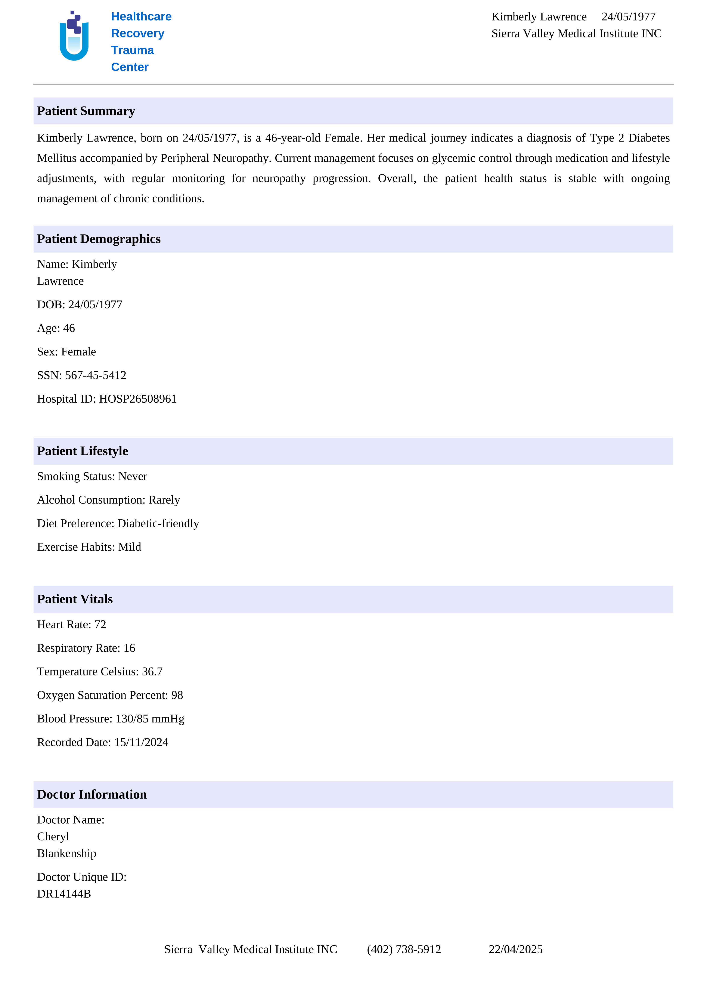


    Image #1:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 400 dpi
    Width: 3307 px
    Height: 4677 px
    Mode: 5
    Number of channels: 3


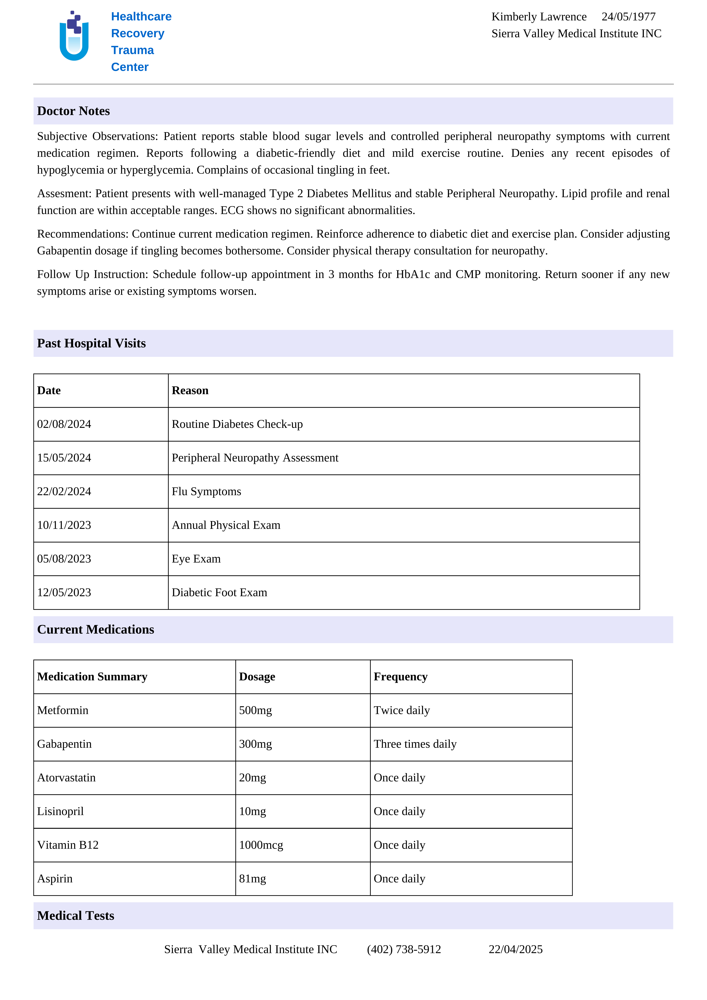


    Image #2:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 400 dpi
    Width: 3307 px
    Height: 4677 px
    Mode: 5
    Number of channels: 3


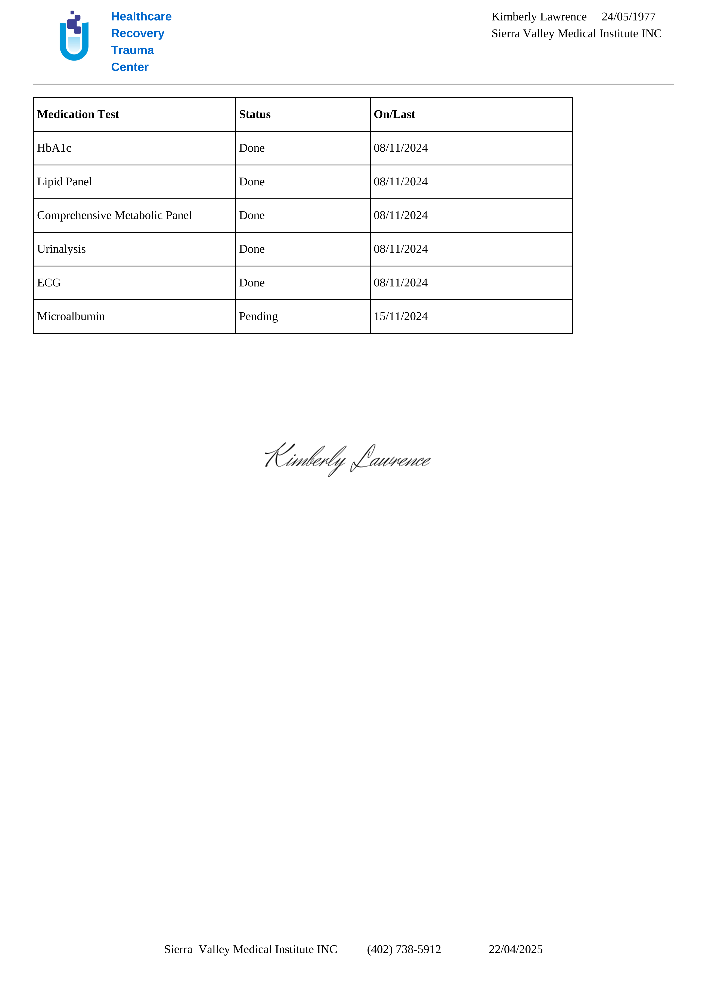

In [32]:
input_df = spark.read.format("binaryFile").load("./source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf")

display_images(pdf_to_image.transform(input_df).orderBy(F.col("pagenum")), "image_raw")


    Image #0:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


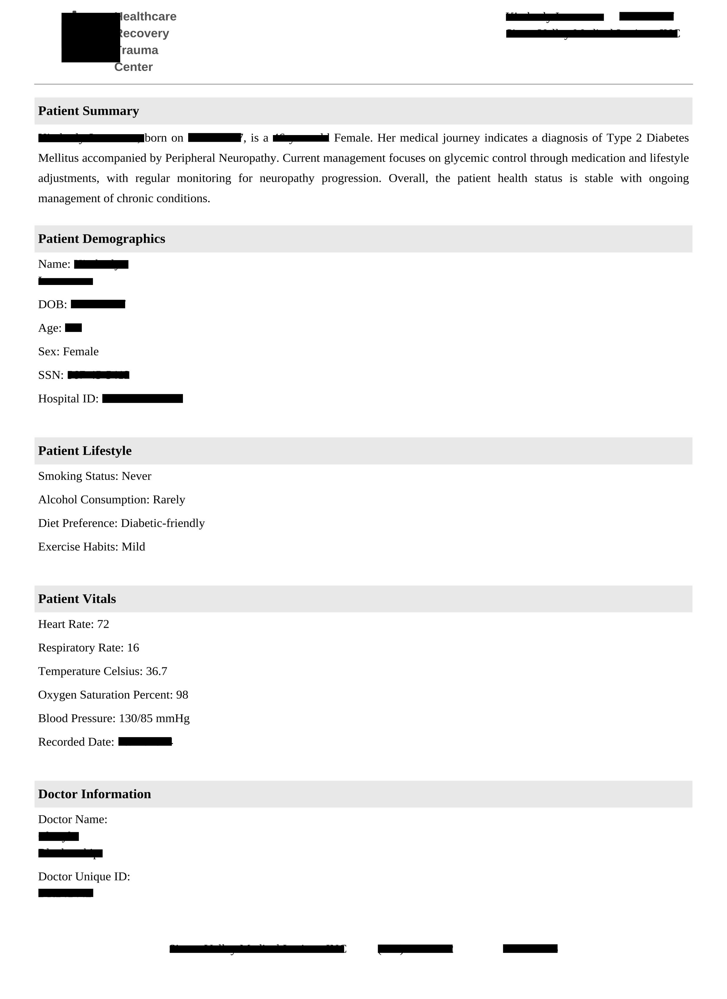


    Image #1:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


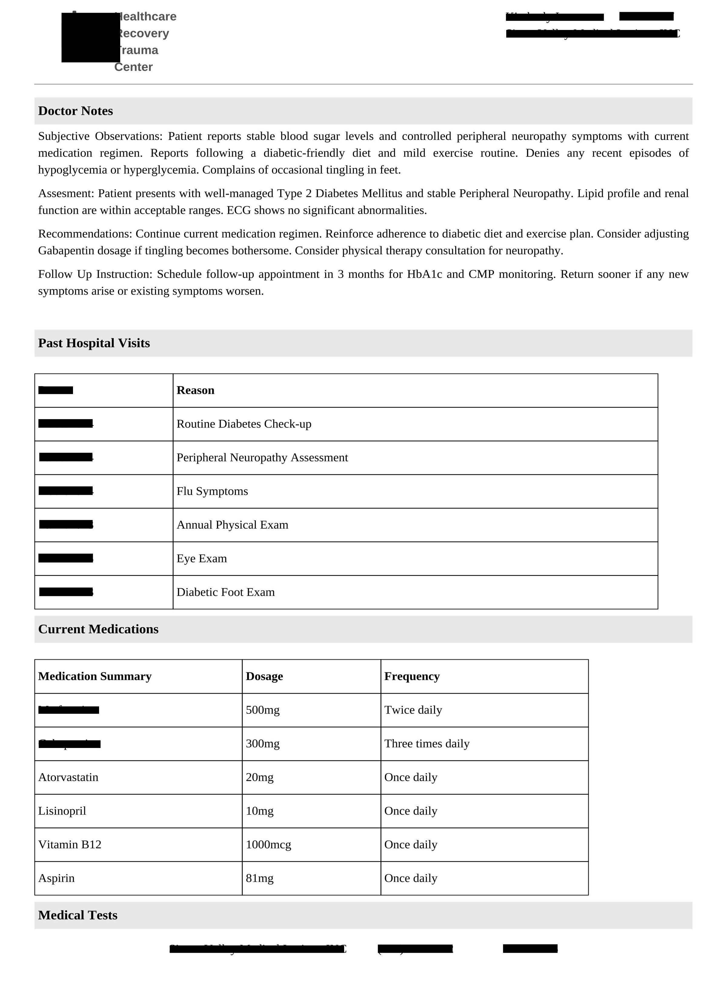


    Image #2:
    Origin: file:/content/source_pdfs/Other/PDF_Deid_Deidentification_0_Signature.pdf
    Resolution: 300 dpi
    Width: 2400 px
    Height: 3299 px
    Mode: 10
    Number of channels: 1


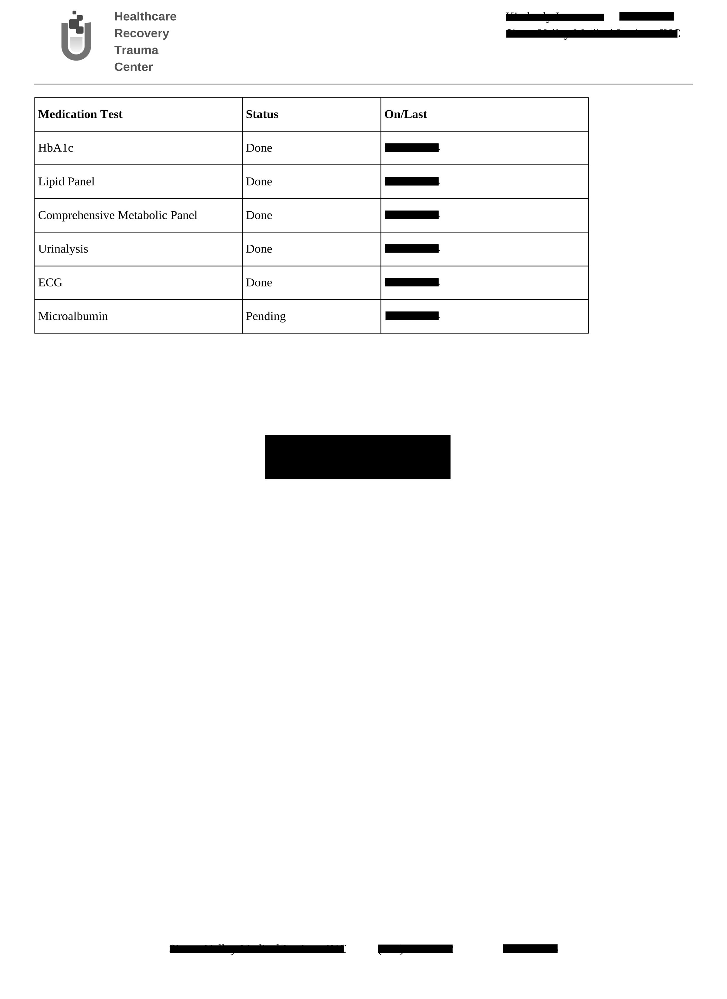

In [33]:
result = deid_pipeline.transform(input_df).cache()

display_pdf(result, "pdf")